El plan es reestructurar el trabajo
1. Revisar datos y sus distribuciones, intentar crear algún ratio o indicador y estudiarlo temporalmente para ver si hay algo que podamos usar para demostrar los datos seleccionados -por ejemplo la estabilidad de la PE en las cosechas para los periodos que selecciono en hocelot para modelar-
2. Probar los moelos en cada cohort: por temporalidad vs ratios estables vs todos los datos
3. Modelar con time split

Es importante ir ilustrando el proceso de trabajo y decisión para el TFM que es lo que quiere ver el profesor


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import IsolationForest
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_auc_score,
    roc_curve
)
from sklearn.preprocessing import label_binarize

from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import NearMiss


# Configs
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
# Ajustar ancho total de la pantalla para evitar cortes
pd.set_option('display.width', 2000)
# Ajustar ancho máximo de cada columna
pd.set_option('display.max_colwidth', None)
# Evitar salto de línea entre columnas
pd.set_option('display.expand_frame_repr', False)
# Mostrar números con formato más limpio
pd.set_option('display.float_format', '{:.4f}'.format)


In [2]:
# Dataset completo
df = pd.read_csv('processed_matches.csv')
df.columns

Index(['home_rank_position', 'home_rank_points', 'away_rank_position',
       'away_rank_points', 'rank_points_diff', 'year', 'neutral',
       'has_shootout', 'tourn_AFC Asian Cup',
       'tourn_AFC Asian Cup qualification',
       ...
       'tourn_World Unity Cup', 'tourn_Zambian Independence Tournament',
       'tourn_Évence Coppée Trophy', 'home_score', 'away_score',
       'ranking_diff', 'goal_diff', 'result', 'is_home', 'ranking_scaled'],
      dtype='object', length=209)

In [3]:
df.shape

(49971, 209)

In [10]:
print(df.loc[:, ~df.columns.str.contains("tourn", case=False, na=False)])

       home_rank_position  home_rank_points  away_rank_position  away_rank_points  rank_points_diff  year  neutral  has_shootout  home_score  away_score  ranking_diff  goal_diff result  is_home  ranking_scaled
0                 38.0000         1506.7700              4.0000         1834.1200         -327.3500  1872        0             0      0.0000      0.0000     -327.3500     0.0000   draw        1          0.5126
1                  4.0000         1834.1200             38.0000         1506.7700          327.3500  1873        0             0      4.0000      2.0000      327.3500     2.0000    win        1          1.7984
2                 38.0000         1506.7700              4.0000         1834.1200         -327.3500  1874        0             0      2.0000      1.0000     -327.3500     1.0000    win        1          0.5126
3                  4.0000         1834.1200             38.0000         1506.7700          327.3500  1875        0             0      2.0000      2.0000      32

In [7]:
df[['home_rank_position', 'home_rank_points', 'away_rank_position',
       'away_rank_points', 'rank_points_diff', 'year', 'neutral',
       'has_shootout', 'home_score', 'away_score',
       'ranking_diff', 'goal_diff', 'result', 'is_home', 'ranking_scaled']].head()

,home_rank_position,home_rank_points,away_rank_position,away_rank_points,rank_points_diff,year,neutral,has_shootout,home_score,away_score,ranking_diff,goal_diff,result,is_home,ranking_scaled
0,38.0000,1506.7700,4.0000,1834.1200,-327.3500,1872,0,0,0.0000,0.0000,-327.3500,0.0000,draw,1,0.5126
1,4.0000,1834.1200,38.0000,1506.7700,327.3500,1873,0,0,4.0000,2.0000,327.3500,2.0000,win,1,1.7984
2,38.0000,1506.7700,4.0000,1834.1200,-327.3500,1874,0,0,2.0000,1.0000,-327.3500,1.0000,win,1,0.5126
3,4.0000,1834.1200,38.0000,1506.7700,327.3500,1875,0,0,2.0000,2.0000,327.3500,0.0000,draw,1,1.7984
4,38.0000,1506.7700,4.0000,1834.1200,-327.3500,1876,0,0,3.0000,0.0000,-327.3500,3.0000,win,1,0.5126


In [27]:
# Primero ver estabilidad de las var por medias
df.groupby('year', as_index=False).agg(
    {
        'home_rank_position': 'mean',
        'home_rank_points': 'mean',
        'away_rank_position': 'mean',
        'away_rank_points': 'mean',
        'rank_points_diff': 'mean',
        'home_score': 'mean',
        'away_score': 'mean',
        'ranking_diff': 'mean',
        'goal_diff': 'mean',
        'ranking_scaled': 'mean'
    }

)

,year,home_rank_position,home_rank_points,away_rank_position,away_rank_points,rank_points_diff,home_score,away_score,ranking_diff,goal_diff,ranking_scaled
0,1872,38.0000,1506.7700,4.0000,1834.1200,-327.3500,0.0000,0.0000,-327.3500,0.0000,0.5126
1,1873,4.0000,1834.1200,38.0000,1506.7700,327.3500,4.0000,2.0000,327.3500,2.0000,1.7984
2,1874,38.0000,1506.7700,4.0000,1834.1200,-327.3500,2.0000,1.0000,-327.3500,1.0000,0.5126
3,1875,4.0000,1834.1200,38.0000,1506.7700,327.3500,2.0000,2.0000,327.3500,0.0000,1.7984
4,1876,38.0000,1506.7700,19.5000,1681.9150,-175.1450,3.5000,0.0000,-175.1450,3.5000,0.5126
5,1877,19.5000,1681.9150,38.0000,1506.7700,175.1450,0.5000,2.5000,175.1450,-2.0000,1.2006
6,1878,38.0000,1506.7700,19.5000,1681.9150,-175.1450,8.0000,1.0000,-175.1450,7.0000,0.5126
7,1879,14.3333,1732.6500,37.0000,1514.4167,218.2333,2.3333,2.6667,218.2333,-0.3333,1.3998
8,1880,37.0000,1514.4167,14.3333,1732.6500,-218.2333,4.0000,2.6667,-218.2333,1.3333,0.5426
9,1881,14.3333,1732.6500,37.0000,1514.4167,218.2333,0.6667,4.0000,218.2333,-3.3333,1.3998


In [34]:
# Primero ver estabilidad de las var por medias
df.groupby('year', as_index=False).agg(
        ranking_mean=('ranking_scaled', 'mean'),
        ranking_median=('ranking_scaled', 'median'),
        ranking_min=('ranking_scaled', 'min'),
        ranking_max=('ranking_scaled', 'max'),
        ranking_std=('ranking_scaled', 'std'),
        ranking_var=('ranking_scaled', 'var'))

,year,ranking_mean,ranking_median,ranking_min,ranking_max,ranking_std,ranking_var
0,1872,0.5126,0.5126,0.5126,0.5126,NaN,NaN
1,1873,1.7984,1.7984,1.7984,1.7984,NaN,NaN
2,1874,0.5126,0.5126,0.5126,0.5126,NaN,NaN
3,1875,1.7984,1.7984,1.7984,1.7984,NaN,NaN
4,1876,0.5126,0.5126,0.5126,0.5126,0.0000,0.0000
5,1877,1.2006,1.2006,0.6027,1.7984,0.8455,0.7148
6,1878,0.5126,0.5126,0.5126,0.5126,0.0000,0.0000
7,1879,1.3998,1.7984,0.6027,1.7984,0.6903,0.4765
8,1880,0.5426,0.5126,0.5126,0.6027,0.0520,0.0027
9,1881,1.3998,1.7984,0.6027,1.7984,0.6903,0.4765


In [35]:
# Primero ver estabilidad de las var por medias
df.groupby('year', as_index=False).agg(
        ranking_mean=('ranking_diff', 'mean'),
        ranking_median=('ranking_diff', 'median'),
        ranking_min=('ranking_diff', 'min'),
        ranking_max=('ranking_diff', 'max'),
        ranking_std=('ranking_diff', 'std'),
        ranking_var=('ranking_diff', 'var'))

,year,ranking_mean,ranking_median,ranking_min,ranking_max,ranking_std,ranking_var
0,1872,-327.3500,-327.3500,-327.3500,-327.3500,NaN,NaN
1,1873,327.3500,327.3500,327.3500,327.3500,NaN,NaN
2,1874,-327.3500,-327.3500,-327.3500,-327.3500,NaN,NaN
3,1875,327.3500,327.3500,327.3500,327.3500,NaN,NaN
4,1876,-175.1450,-175.1450,-327.3500,-22.9400,215.2504,46332.7240
5,1877,175.1450,175.1450,22.9400,327.3500,215.2504,46332.7240
6,1878,-175.1450,-175.1450,-327.3500,-22.9400,215.2504,46332.7240
7,1879,218.2333,304.4100,22.9400,327.3500,169.5175,28736.1754
8,1880,-218.2333,-304.4100,-327.3500,-22.9400,169.5175,28736.1754
9,1881,218.2333,304.4100,22.9400,327.3500,169.5175,28736.1754


In [36]:
# Primero ver estabilidad de las var por medias
df.groupby('year', as_index=False).agg(
        ranking_mean=('goal_diff', 'mean'),
        ranking_median=('goal_diff', 'median'),
        ranking_min=('goal_diff', 'min'),
        ranking_max=('goal_diff', 'max'),
        ranking_std=('goal_diff', 'std'),
        ranking_var=('goal_diff', 'var'))

,year,ranking_mean,ranking_median,ranking_min,ranking_max,ranking_std,ranking_var
0,1872,0.0000,0.0000,0.0000,0.0000,NaN,NaN
1,1873,2.0000,2.0000,2.0000,2.0000,NaN,NaN
2,1874,1.0000,1.0000,1.0000,1.0000,NaN,NaN
3,1875,0.0000,0.0000,0.0000,0.0000,NaN,NaN
4,1876,3.5000,3.5000,3.0000,4.0000,0.7071,0.5000
5,1877,-2.0000,-2.0000,-2.0000,-2.0000,0.0000,0.0000
6,1878,7.0000,7.0000,5.0000,9.0000,2.8284,8.0000
7,1879,-0.3333,1.0000,-3.0000,1.0000,2.3094,5.3333
8,1880,1.3333,1.0000,-1.0000,4.0000,2.5166,6.3333
9,1881,-3.3333,-4.0000,-5.0000,-1.0000,2.0817,4.3333


In [37]:
# Primero ver estabilidad de las var por medias
df.groupby('year', as_index=False).agg(
        ranking_mean=('rank_points_diff', 'mean'),
        ranking_median=('rank_points_diff', 'median'),
        ranking_min=('rank_points_diff', 'min'),
        ranking_max=('rank_points_diff', 'max'),
        ranking_std=('rank_points_diff', 'std'),
        ranking_var=('rank_points_diff', 'var'))

,year,ranking_mean,ranking_median,ranking_min,ranking_max,ranking_std,ranking_var
0,1872,-327.3500,-327.3500,-327.3500,-327.3500,NaN,NaN
1,1873,327.3500,327.3500,327.3500,327.3500,NaN,NaN
2,1874,-327.3500,-327.3500,-327.3500,-327.3500,NaN,NaN
3,1875,327.3500,327.3500,327.3500,327.3500,NaN,NaN
4,1876,-175.1450,-175.1450,-327.3500,-22.9400,215.2504,46332.7240
5,1877,175.1450,175.1450,22.9400,327.3500,215.2504,46332.7240
6,1878,-175.1450,-175.1450,-327.3500,-22.9400,215.2504,46332.7240
7,1879,218.2333,304.4100,22.9400,327.3500,169.5175,28736.1754
8,1880,-218.2333,-304.4100,-327.3500,-22.9400,169.5175,28736.1754
9,1881,218.2333,304.4100,22.9400,327.3500,169.5175,28736.1754


# Bases

## API matches

In [8]:
# Base API de matches
# Inicial
matches_initial = pd.read_csv('api_matches_curated.csv')
print(matches_initial.shape)
matches_initial.head()

(1943, 18)


,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral,has_shootout,shootout_winner,goalscorers_rows,penalty_goals_count,own_goals_count,fixture_id,league_id,season,source
0,2022-11-20,Qatar,Ecuador,0.0000,2.0000,World Cup,NaN,NaN,NaN,False,NaN,0,0,0,855736,1,2022,api_football
1,2022-11-21,England,Iran,6.0000,2.0000,World Cup,NaN,NaN,NaN,False,NaN,0,0,0,855735,1,2022,api_football
2,2022-11-21,Senegal,Netherlands,0.0000,2.0000,World Cup,NaN,NaN,NaN,False,NaN,0,0,0,855734,1,2022,api_football
3,2022-11-21,United States,Wales,1.0000,1.0000,World Cup,NaN,NaN,NaN,False,NaN,0,0,0,866681,1,2022,api_football
4,2022-11-22,Argentina,Saudi Arabia,1.0000,2.0000,World Cup,NaN,NaN,NaN,False,NaN,0,0,0,855737,1,2022,api_football


In [9]:
## Base procesada
matches_processed = pd.read_csv('api_matches_curated_fixtures_processed.csv')
print(matches_processed.shape)
matches_processed.head()

(1943, 10)


,fixture_id,date,home_team,away_team,home_score,away_score,tournament,league_id,season,source
0,855736,2022-11-20,Qatar,Ecuador,0.0000,2.0000,World Cup,1,2022,api_football
1,855735,2022-11-21,England,Iran,6.0000,2.0000,World Cup,1,2022,api_football
2,855734,2022-11-21,Senegal,Netherlands,0.0000,2.0000,World Cup,1,2022,api_football
3,866681,2022-11-21,USA,Wales,1.0000,1.0000,World Cup,1,2022,api_football
4,855737,2022-11-22,Argentina,Saudi Arabia,1.0000,2.0000,World Cup,1,2022,api_football


In [11]:
matches_initial[matches_initial['fixture_id']==855736]

,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral,has_shootout,shootout_winner,goalscorers_rows,penalty_goals_count,own_goals_count,fixture_id,league_id,season,source
0,2022-11-20,Qatar,Ecuador,0.0000,2.0000,World Cup,NaN,NaN,NaN,False,NaN,0,0,0,855736,1,2022,api_football


In [12]:
matches_processed[matches_processed['fixture_id']==855736]

,fixture_id,date,home_team,away_team,home_score,away_score,tournament,league_id,season,source
0,855736,2022-11-20,Qatar,Ecuador,0.0000,2.0000,World Cup,1,2022,api_football


## API matches with ranking 

In [13]:
ranking_initial = pd.read_csv('api_matches_with_ranking.csv')
print(ranking_initial.shape)
ranking_initial.head()

(1943, 25)


,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral,has_shootout,shootout_winner,goalscorers_rows,penalty_goals_count,own_goals_count,fixture_id,league_id,season,source,home_team_norm,away_team_norm,home_rank_position,home_rank_points,away_rank_position,away_rank_points,rank_points_diff
0,2022-11-20,Qatar,Ecuador,0.0000,2.0000,World Cup,NaN,NaN,NaN,False,NaN,0,0,0,855736,1,2022,api_football,Qatar,Ecuador,56.0000,1454.9600,23.0000,1591.7300,-136.7700
1,2022-11-21,England,Iran,6.0000,2.0000,World Cup,NaN,NaN,NaN,False,NaN,0,0,0,855735,1,2022,api_football,England,IR Iran,4.0000,1834.1200,20.0000,1617.0200,217.1000
2,2022-11-21,Senegal,Netherlands,0.0000,2.0000,World Cup,NaN,NaN,NaN,False,NaN,0,0,0,855734,1,2022,api_football,Senegal,Netherlands,14.0000,1684.8600,7.0000,1756.2700,-71.4100
3,2022-11-21,United States,Wales,1.0000,1.0000,World Cup,NaN,NaN,NaN,False,NaN,0,0,0,866681,1,2022,api_football,USA,Wales,15.0000,1681.8800,35.0000,1529.7100,152.1700
4,2022-11-22,Argentina,Saudi Arabia,1.0000,2.0000,World Cup,NaN,NaN,NaN,False,NaN,0,0,0,855737,1,2022,api_football,Argentina,Saudi Arabia,2.0000,1873.3300,61.0000,1429.4800,443.8500


In [14]:
ranking_processed = pd.read_csv('ranking_processed.csv')
print(ranking_processed.shape)
ranking_processed.head()

(210, 3)


,position,team,points
0,1,Spain,1877.1800
1,2,Argentina,1873.3300
2,3,France,1870.0000
3,4,England,1834.1200
4,5,Brazil,1760.4600


## Kaggle matches

In [15]:
kaggle_matches_curated = pd.read_csv('kaggle_matches_curated.csv')
print(kaggle_matches_curated.shape)
kaggle_matches_curated.head()

(48891, 15)


,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral,shootout_winner,has_shootout,goalscorers_rows,penalty_goals_count,own_goals_count,match_key
0,1872-11-30,Scotland,England,0,0,Friendly,Glasgow,Scotland,False,NaN,False,0,0,0,1872-11-30|Scotland|England|0
1,1873-03-08,England,Scotland,4,2,Friendly,London,England,False,NaN,False,0,0,0,1873-03-08|England|Scotland|1
2,1874-03-07,Scotland,England,2,1,Friendly,Glasgow,Scotland,False,NaN,False,0,0,0,1874-03-07|Scotland|England|2
3,1875-03-06,England,Scotland,2,2,Friendly,London,England,False,NaN,False,0,0,0,1875-03-06|England|Scotland|3
4,1876-03-04,Scotland,England,3,0,Friendly,Glasgow,Scotland,False,NaN,False,0,0,0,1876-03-04|Scotland|England|4


In [17]:
former_names_processed = pd.read_csv('former_names_processed.csv')
print(former_names_processed.shape)
former_names_processed.head()

(34, 4)


,current,former,start_date,end_date
0,Benin,Dahomey,1959-11-08,1975-11-30
1,Burkina Faso,Upper Volta,1960-04-14,1984-08-04
2,Curaçao,Netherlands Antilles,1957-03-03,2010-10-10
3,Czechoslovakia,Bohemia,1903-04-05,1919-01-01
4,Czechoslovakia,Bohemia and Moravia,1939-01-01,1945-05-01


In [18]:
goalscorers_processed = pd.read_csv('goalscorers_processed.csv')
print(goalscorers_processed.shape)
goalscorers_processed.head()

(44447, 8)


,date,home_team,away_team,team,scorer,minute,own_goal,penalty
0,1916-07-02,Chile,Uruguay,Uruguay,José Piendibene,44.0000,False,False
1,1916-07-02,Chile,Uruguay,Uruguay,Isabelino Gradín,55.0000,False,False
2,1916-07-02,Chile,Uruguay,Uruguay,Isabelino Gradín,70.0000,False,False
3,1916-07-02,Chile,Uruguay,Uruguay,José Piendibene,75.0000,False,False
4,1916-07-06,Argentina,Chile,Argentina,Alberto Ohaco,2.0000,False,False


In [19]:
results_processed = pd.read_csv('results_processed.csv')
print(results_processed.shape)
results_processed.head()

(48891, 9)


,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral
0,1872-11-30,Scotland,England,0,0,Friendly,Glasgow,Scotland,False
1,1873-03-08,England,Scotland,4,2,Friendly,London,England,False
2,1874-03-07,Scotland,England,2,1,Friendly,Glasgow,Scotland,False
3,1875-03-06,England,Scotland,2,2,Friendly,London,England,False
4,1876-03-04,Scotland,England,3,0,Friendly,Glasgow,Scotland,False


In [20]:
shootouts_processed = pd.read_csv('shootouts_processed.csv')
print(shootouts_processed.shape)
shootouts_processed.head()

(662, 5)


,date,home_team,away_team,winner,first_shooter
0,1967-08-22,India,Taiwan,Taiwan,NaN
1,1971-11-14,South Korea,Vietnam Republic,South Korea,NaN
2,1972-05-07,South Korea,Iraq,Iraq,NaN
3,1972-05-17,Thailand,South Korea,South Korea,NaN
4,1972-05-19,Thailand,Cambodia,Thailand,NaN


In [21]:
kaggle_matches_with_ranking = pd.read_csv('kaggle_matches_with_ranking.csv')
print(kaggle_matches_with_ranking.shape)
kaggle_matches_with_ranking.head()

(48891, 23)


,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral,shootout_winner,has_shootout,goalscorers_rows,penalty_goals_count,own_goals_count,match_key,home_team_norm,away_team_norm,home_rank_position,home_rank_points,away_rank_position,away_rank_points,rank_points_diff,match_outcome
0,1872-11-30,Scotland,England,0,0,Friendly,Glasgow,Scotland,False,NaN,False,0,0,0,1872-11-30|Scotland|England|0,Scotland,England,38.0000,1506.7700,4.0000,1834.1200,-327.3500,0
1,1873-03-08,England,Scotland,4,2,Friendly,London,England,False,NaN,False,0,0,0,1873-03-08|England|Scotland|1,England,Scotland,4.0000,1834.1200,38.0000,1506.7700,327.3500,1
2,1874-03-07,Scotland,England,2,1,Friendly,Glasgow,Scotland,False,NaN,False,0,0,0,1874-03-07|Scotland|England|2,Scotland,England,38.0000,1506.7700,4.0000,1834.1200,-327.3500,1
3,1875-03-06,England,Scotland,2,2,Friendly,London,England,False,NaN,False,0,0,0,1875-03-06|England|Scotland|3,England,Scotland,4.0000,1834.1200,38.0000,1506.7700,327.3500,0
4,1876-03-04,Scotland,England,3,0,Friendly,Glasgow,Scotland,False,NaN,False,0,0,0,1876-03-04|Scotland|England|4,Scotland,England,38.0000,1506.7700,4.0000,1834.1200,-327.3500,1


## Matches final

In [22]:
matches_final_curated = pd.read_csv('matches_final_curated.csv')
print(matches_final_curated.shape)
matches_final_curated.head()

(50834, 27)


,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral,shootout_winner,has_shootout,goalscorers_rows,penalty_goals_count,own_goals_count,match_key,home_team_norm,away_team_norm,home_rank_position,home_rank_points,away_rank_position,away_rank_points,rank_points_diff,match_outcome,source,fixture_id,league_id,season
0,1872-11-30,Scotland,England,0.0000,0.0000,Friendly,Glasgow,Scotland,0.0000,NaN,False,0,0,0,1872-11-30|Scotland|England|0,Scotland,England,38.0000,1506.7700,4.0000,1834.1200,-327.3500,0.0000,kaggle,NaN,NaN,NaN
1,1873-03-08,England,Scotland,4.0000,2.0000,Friendly,London,England,0.0000,NaN,False,0,0,0,1873-03-08|England|Scotland|1,England,Scotland,4.0000,1834.1200,38.0000,1506.7700,327.3500,1.0000,kaggle,NaN,NaN,NaN
2,1874-03-07,Scotland,England,2.0000,1.0000,Friendly,Glasgow,Scotland,0.0000,NaN,False,0,0,0,1874-03-07|Scotland|England|2,Scotland,England,38.0000,1506.7700,4.0000,1834.1200,-327.3500,1.0000,kaggle,NaN,NaN,NaN
3,1875-03-06,England,Scotland,2.0000,2.0000,Friendly,London,England,0.0000,NaN,False,0,0,0,1875-03-06|England|Scotland|3,England,Scotland,4.0000,1834.1200,38.0000,1506.7700,327.3500,0.0000,kaggle,NaN,NaN,NaN
4,1876-03-04,Scotland,England,3.0000,0.0000,Friendly,Glasgow,Scotland,0.0000,NaN,False,0,0,0,1876-03-04|Scotland|England|4,Scotland,England,38.0000,1506.7700,4.0000,1834.1200,-327.3500,1.0000,kaggle,NaN,NaN,NaN


In [23]:
matches_final_curated['fixture_id'].describe()

count      1943.0000
mean    1047152.1369
std      190443.9049
min      592666.0000
25%      861035.0000
50%     1035605.0000
75%     1175759.5000
max     1487929.0000
Name: fixture_id, dtype: float64

## Mapping

In [25]:
api_to_kaggle_mapping = pd.read_csv('api_to_kaggle_mapping.csv',
    encoding='latin1')
print(api_to_kaggle_mapping.shape)
api_to_kaggle_mapping.head()

(7, 2)


,kaggle_name,api_name
0,South Korea,South Korea
1,United States,USA
2,Iran,Iran
3,Ivory Coast,Ivory Coast
4,Turkey,Türkiye


In [26]:
team_name_mapping = pd.read_csv('team_name_mapping.csv',
    encoding='latin1')
print(team_name_mapping.shape)
team_name_mapping.head()

(7, 2)


,kaggle_name,ranking_name
0,South Korea,Korea Republic
1,United States,USA
2,Iran,IR Iran
3,Ivory Coast,Côte d'Ivoire
4,Turkey,Türkiye


# Base final + models
Se entrenarán entonces 4 tipos de series de modelos:
- Todos los años
- 30 años
- 20 años 
- 10 años

# Todos los años con timesplit


In [49]:
# Dataset completo
df = pd.read_csv('processed_matches.csv')
df.columns

Index(['home_rank_position', 'home_rank_points', 'away_rank_position', 'away_rank_points', 'rank_points_diff', 'year', 'neutral', 'has_shootout', 'tourn_AFC Asian Cup', 'tourn_AFC Asian Cup qualification',
       ...
       'tourn_World Unity Cup', 'tourn_Zambian Independence Tournament', 'tourn_Évence Coppée Trophy', 'home_score', 'away_score', 'ranking_diff', 'goal_diff', 'result', 'is_home', 'ranking_scaled'], dtype='object', length=209)

In [50]:
df.shape

(49971, 209)

In [51]:
df['result'].value_counts()

result
win     24499
lose    14123
draw    11349
Name: count, dtype: int64

In [52]:
# FEATURE ENGINEERING

# Diferencias y relaciones
df['rank_position_diff'] = df['away_rank_position'] - df['home_rank_position']
df['rank_points_diff'] = df['home_rank_points'] - df['away_rank_points']
df['rank_points_sum'] = df['home_rank_points'] + df['away_rank_points']
df['rank_points_ratio'] = df['home_rank_points'] / (df['away_rank_points'] + 1)
df['abs_rank_points_diff'] = df['rank_points_diff'].abs()

# Transformaciones
df['log_home_rank_points'] = np.log1p(df['home_rank_points'])
df['log_away_rank_points'] = np.log1p(df['away_rank_points'])
df['inv_home_rank_position'] = 1 / (df['home_rank_position'] + 1)
df['inv_away_rank_position'] = 1 / (df['away_rank_position'] + 1)

# Feature útil para empates
df['is_close_match'] = (df['abs_rank_points_diff'] < 50).astype(int)

In [53]:
# TARGET MULTICLASE
# 0 = lose, 1 = draw, 2 = win
df['target'] = np.select(
    [
        df['home_score'] > df['away_score'],
        df['home_score'] == df['away_score'],
        df['home_score'] < df['away_score']
    ],
    [2, 1, 0]
)


df['has_shootout'] = df['has_shootout'].astype(int)
df['neutral'] = df['neutral'].fillna(0).astype(int)

In [54]:
df['target'].value_counts()

target
2    24499
0    14123
1    11349
Name: count, dtype: int64

In [55]:
# DETECTAR DUMMIES EXISTENTES
tournament_features = [col for col in df.columns if col.startswith('tourn_')]
len(tournament_features)

194

In [56]:
# Transformar dummies a binarias
for col in tournament_features:
    df[col] = df[col].apply(lambda x: 1 if x > 0 else 0)

In [57]:
# FEATURES
rank_features = [
    'home_rank_position',
    'home_rank_points',
    'away_rank_position',
    'away_rank_points',
    'rank_points_diff'
]

engineered_features = [
    'rank_position_diff',
    'rank_points_sum',
    'rank_points_ratio',
    'abs_rank_points_diff',
    'log_home_rank_points',
    'log_away_rank_points',
    'inv_home_rank_position',
    'inv_away_rank_position',
    'is_close_match'
]

other_features = [
    'year',
    'neutral',
    'has_shootout'
]

features = rank_features + engineered_features + other_features + tournament_features
len(features)

211

In [58]:
from sklearn.model_selection import TimeSeriesSplit

# DATASET MODELO
target = 'target'
df_final = df[features + [target]]

# IMPORTANTE: orden cronológico
df_final = df_final.sort_values('year') 

# Separar variables
X = df_final[features].values
y = df_final[target].values

# VALIDACIÓN TEMPORAL (walk-forward)
tscv = TimeSeriesSplit(n_splits=5)

for fold, (train_index, test_index) in enumerate(tscv.split(X), 1):

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    print(f"Fold {fold}")
    print(f"Train: {len(train_index)} registros | Test: {len(test_index)} registros")


Fold 1
Train: 8331 registros | Test: 8328 registros
Fold 2
Train: 16659 registros | Test: 8328 registros
Fold 3
Train: 24987 registros | Test: 8328 registros
Fold 4
Train: 33315 registros | Test: 8328 registros
Fold 5
Train: 41643 registros | Test: 8328 registros


# Modelos

## Random Forest

In [75]:
# Entrenar modelo
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import TimeSeriesSplit

rf_model = RandomForestClassifier(random_state=42)
tscv = TimeSeriesSplit(n_splits=5)

# ACUMULAR predicciones de todos los folds
all_y_test = []
all_y_pred = []
all_y_proba = []

for fold, (train_idx, test_idx) in enumerate(tscv.split(X), 1):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    rf_model.fit(X_train, y_train)
    
    # Guardar predicciones de este fold
    y_pred = rf_model.predict(X_test)
    y_proba = rf_model.predict_proba(X_test)
    
    all_y_test.extend(y_test)
    all_y_pred.extend(y_pred)
    all_y_proba.append(y_proba)
    
    acc = accuracy_score(y_test, y_pred)
    print(f"Fold {fold} - Accuracy: {acc:.4f}")

# Convertir a arrays
all_y_test = np.array(all_y_test)
all_y_pred = np.array(all_y_pred)
all_y_proba = np.vstack(all_y_proba)

print(f"\nAccuracy general (todos los folds): {accuracy_score(all_y_test, all_y_pred):.4f}")

Fold 1 - Accuracy: 0.4911
Fold 2 - Accuracy: 0.5191
Fold 3 - Accuracy: 0.5269
Fold 4 - Accuracy: 0.5184
Fold 5 - Accuracy: 0.5540

Accuracy general (todos los folds): 0.5219


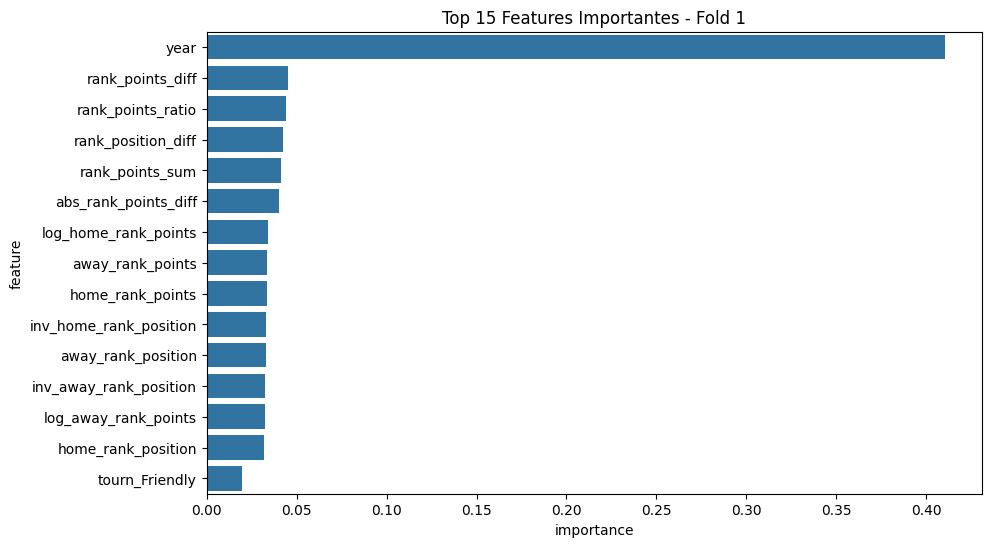

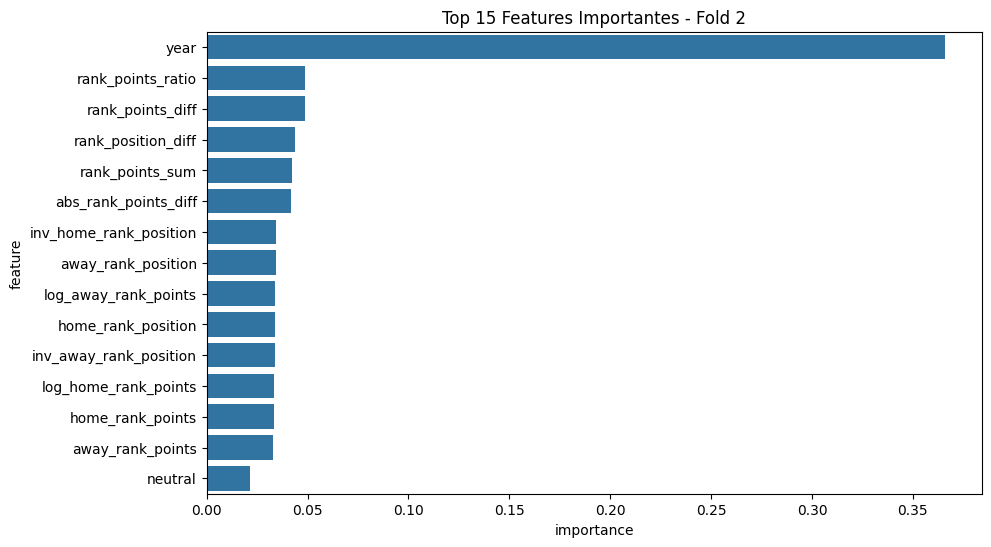

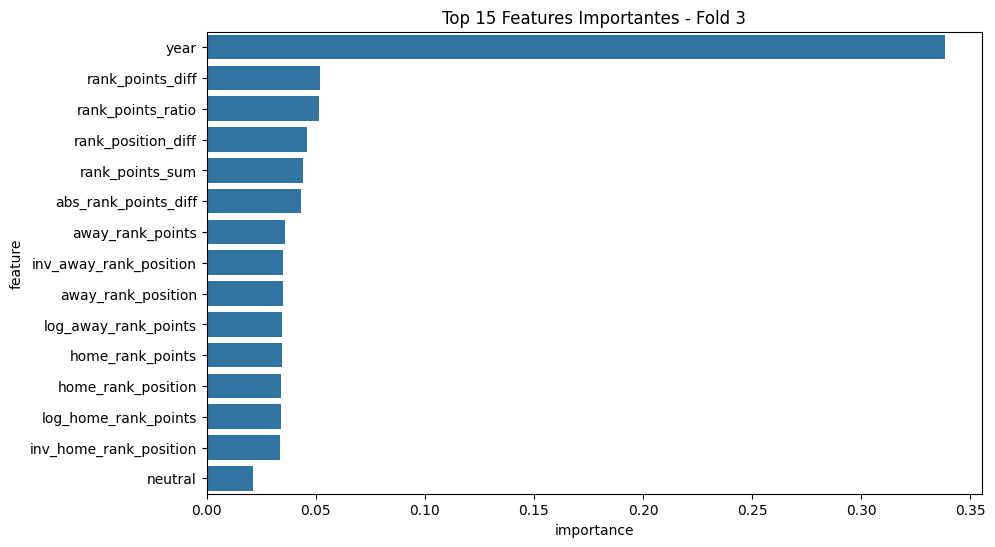

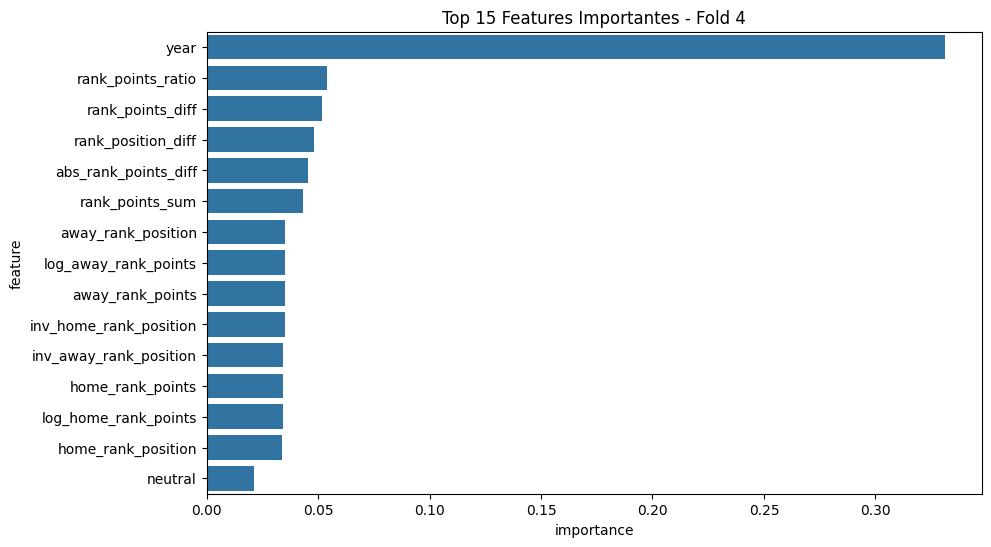

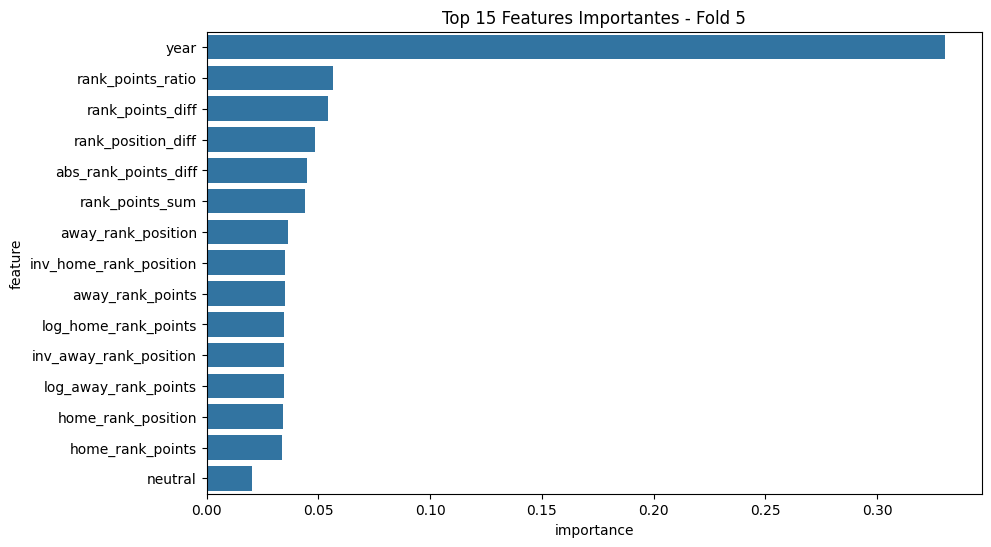

In [61]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(random_state=42)
tscv = TimeSeriesSplit(n_splits=5)

fold_importances = []

for fold, (train_idx, test_idx) in enumerate(tscv.split(X), 1):

    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    rf_model.fit(X_train, y_train)

    # =========================
    # FEATURE IMPORTANCE POR FOLD
    # =========================
    feature_importance = pd.DataFrame({
        'feature': features,   # <-- importante: usa la lista original, no X.columns
        'importance': rf_model.feature_importances_,
        'fold': fold
    })

    fold_importances.append(feature_importance)

    # Plot por fold
    top_features = feature_importance.sort_values(
        by='importance', ascending=False
    ).head(15)

    plt.figure(figsize=(10, 6))
    sns.barplot(data=top_features, x='importance', y='feature')
    plt.title(f'Top 15 Features Importantes - Fold {fold}')
    plt.show()

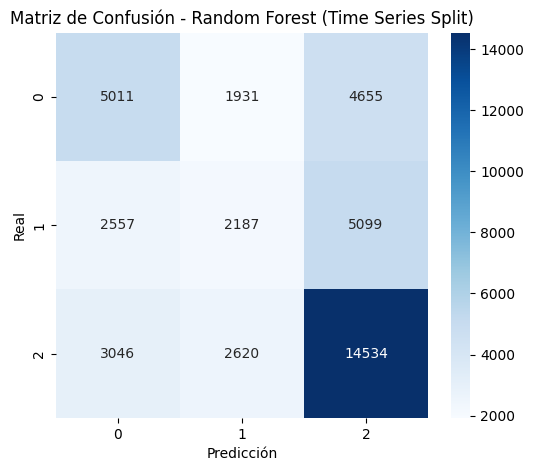

=== REPORTE DE CLASIFICACIÓN ===
              precision    recall  f1-score   support

           0       0.47      0.43      0.45     11597
           1       0.32      0.22      0.26      9843
           2       0.60      0.72      0.65     20200

    accuracy                           0.52     41640
   macro avg       0.47      0.46      0.46     41640
weighted avg       0.50      0.52      0.50     41640



In [76]:
# Matriz de confusión - CON TODOS LOS FOLDS
cm = confusion_matrix(all_y_test, all_y_pred)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Matriz de Confusión - Random Forest (Time Series Split)')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

print("=== REPORTE DE CLASIFICACIÓN ===")
print(classification_report(all_y_test, all_y_pred))

In [77]:
# AUC MULTICLASE (todos los folds)
classes = rf_model.classes_
y_test_bin = label_binarize(all_y_test, classes=classes)

auc_macro = roc_auc_score(y_test_bin, all_y_proba, average='macro', multi_class='ovr')
auc_weighted = roc_auc_score(y_test_bin, all_y_proba, average='weighted', multi_class='ovr')

print(f"AUC Macro: {auc_macro:.4f}")
print(f"AUC Weighted: {auc_weighted:.4f}")

AUC Macro: 0.6565
AUC Weighted: 0.6683


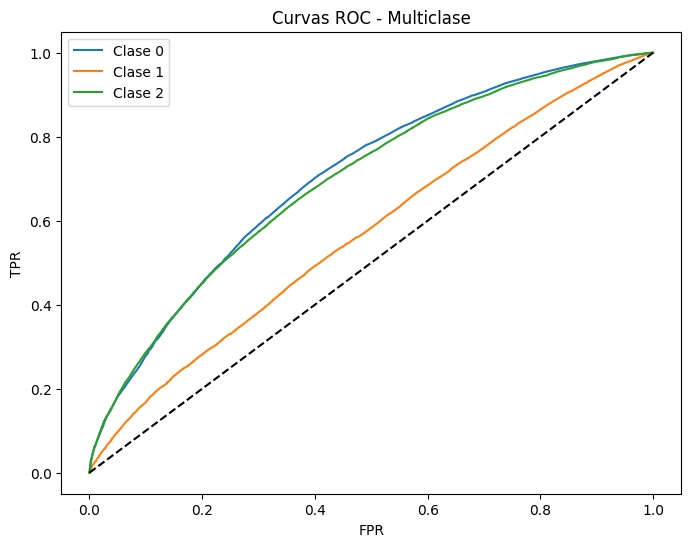

In [80]:
# Curvas ROC
plt.figure(figsize=(8,6))

for i, class_label in enumerate(classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], all_y_proba[:, i])
    plt.plot(fpr, tpr, label=f'Clase {class_label}')

plt.plot([0,1], [0,1], 'k--')
plt.title('Curvas ROC - Multiclase')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()
plt.show()

In [81]:
gini_macro = 2 * auc_macro - 1
print(f"Gini (macro): {gini_macro:.4f}")


Gini (macro): 0.3129


In [83]:
# KS
def ks_statistic(y_true, y_prob):
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    return np.max(tpr - fpr)

print("\nKS por clase:")
for i, class_label in enumerate(classes):
    ks = ks_statistic(y_test_bin[:, i], all_y_proba[:, i])
    print(f"Clase {class_label}: KS = {ks:.4f}")


KS por clase:
Clase 0: KS = 0.3023
Clase 1: KS = 0.0924
Clase 2: KS = 0.2807


In [90]:
# Errores usando los resultados consolidados de todos los folds
errors = pd.DataFrame({
    'y_true': all_y_test,
    'y_pred': all_y_pred
})
errors['correct'] = errors['y_true'] == errors['y_pred']

error_rate = 1 - errors['correct'].mean()
print(f"\nError rate: {error_rate:.4f}")

print("\nEjemplos de errores:")
display(errors[errors['correct'] == False].head())


Error rate: 0.4781

Ejemplos de errores:


,y_true,y_pred,correct
2,1,2,False
3,0,1,False
9,1,2,False
10,1,2,False
11,0,2,False


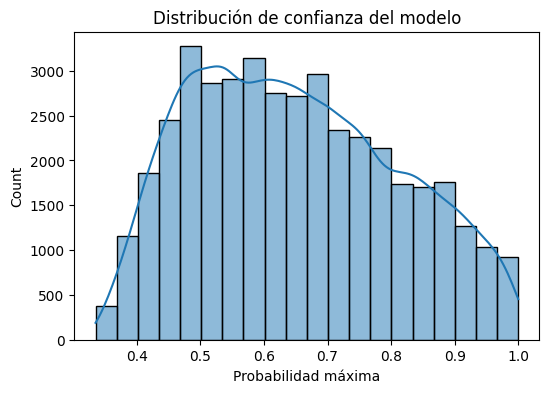

In [92]:
# Ps
confidence = np.max(all_y_proba, axis=1)

plt.figure(figsize=(6,4))
sns.histplot(confidence, bins=20, kde=True)
plt.title('Distribución de confianza del modelo')
plt.xlabel('Probabilidad máxima')
plt.show()

## Regresión logística multinomial

In [95]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import numpy as np

logreg = make_pipeline(
    StandardScaler(),
    LogisticRegression(
        solver='lbfgs',
        max_iter=1000,
        random_state=42
    )
)

all_y_test_lr = []
all_y_pred_lr = []
all_y_proba_lr = []

for fold, (train_idx, test_idx) in enumerate(tscv.split(X), start=1):
    X_train = X.iloc[train_idx] if hasattr(X, "iloc") else X[train_idx]
    X_test  = X.iloc[test_idx]  if hasattr(X, "iloc") else X[test_idx]
    y_train = y.iloc[train_idx] if hasattr(y, "iloc") else y[train_idx]
    y_test  = y.iloc[test_idx]  if hasattr(y, "iloc") else y[test_idx]

    logreg.fit(X_train, y_train)

    y_pred = logreg.predict(X_test)
    y_proba = logreg.predict_proba(X_test)

    all_y_test_lr.append(np.array(y_test))
    all_y_pred_lr.append(y_pred)
    all_y_proba_lr.append(y_proba)

    acc = accuracy_score(y_test, y_pred)
    print(f"Fold {fold} - Accuracy: {acc:.4f}")

all_y_test_lr = np.concatenate(all_y_test_lr)
all_y_pred_lr = np.concatenate(all_y_pred_lr)
all_y_proba_lr = np.vstack(all_y_proba_lr)

print(f"\nAccuracy general (todos los folds): {accuracy_score(all_y_test_lr, all_y_pred_lr):.4f}")

Fold 1 - Accuracy: 0.5249
Fold 2 - Accuracy: 0.5497
Fold 3 - Accuracy: 0.5527
Fold 4 - Accuracy: 0.5602
Fold 5 - Accuracy: 0.5953

Accuracy general (todos los folds): 0.5566


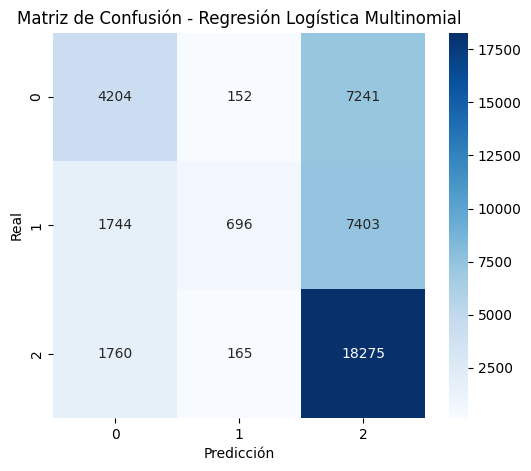

In [96]:
cm_lr = confusion_matrix(all_y_test_lr, all_y_pred_lr)
plt.figure(figsize=(6,5))
sns.heatmap(cm_lr, annot=True, fmt='d', cmap='Blues')
plt.title('Matriz de Confusión - Regresión Logística Multinomial')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

In [97]:
print('=== REPORTE DE CLASIFICACIÓN (Regresión Logística) ===')
print(classification_report(all_y_test_lr, all_y_pred_lr))

=== REPORTE DE CLASIFICACIÓN (Regresión Logística) ===
              precision    recall  f1-score   support

           0       0.55      0.36      0.44     11597
           1       0.69      0.07      0.13      9843
           2       0.56      0.90      0.69     20200

    accuracy                           0.56     41640
   macro avg       0.60      0.45      0.42     41640
weighted avg       0.58      0.56      0.49     41640



In [98]:
classes_lr = np.unique(all_y_test_lr)
y_test_bin_lr = label_binarize(all_y_test_lr, classes=classes_lr)
auc_macro_lr = roc_auc_score(y_test_bin_lr, all_y_proba_lr, average='macro', multi_class='ovr')
auc_weighted_lr = roc_auc_score(y_test_bin_lr, all_y_proba_lr, average='weighted', multi_class='ovr')
print(f"AUC Macro: {auc_macro_lr:.4f}")
print(f"AUC Weighted: {auc_weighted_lr:.4f}")

AUC Macro: 0.6858
AUC Weighted: 0.6966


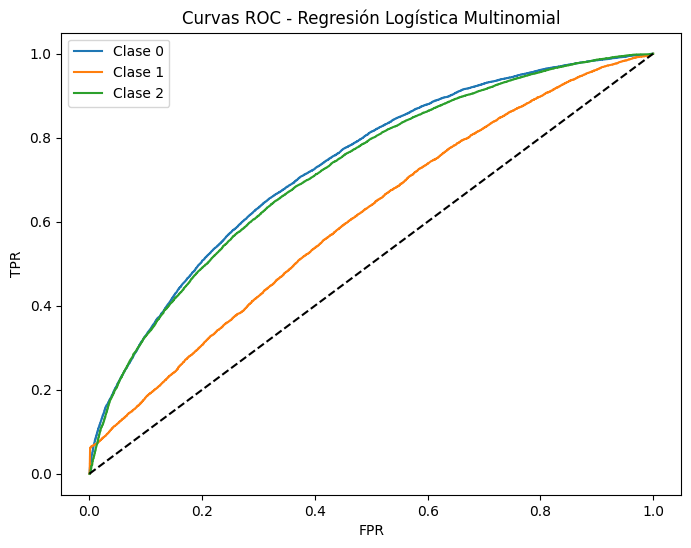

In [99]:
plt.figure(figsize=(8,6))
for i, class_label in enumerate(classes_lr):
    fpr, tpr, _ = roc_curve(y_test_bin_lr[:, i], all_y_proba_lr[:, i])
    plt.plot(fpr, tpr, label=f'Clase {class_label}')
plt.plot([0,1], [0,1], 'k--')
plt.title('Curvas ROC - Regresión Logística Multinomial')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()
plt.show()

In [100]:
errors_lr = pd.DataFrame({'y_true': all_y_test_lr, 'y_pred': all_y_pred_lr})
errors_lr['correct'] = errors_lr['y_true'] == errors_lr['y_pred']
error_rate_lr = 1 - errors_lr['correct'].mean()
print(f"\nError rate: {error_rate_lr:.4f}")
print("\nEjemplos de errores:")
display(errors_lr[errors_lr['correct'] == False].head())


Error rate: 0.4434

Ejemplos de errores:


,y_true,y_pred,correct
2,1,2,False
3,0,2,False
9,1,2,False
10,1,2,False
11,0,2,False


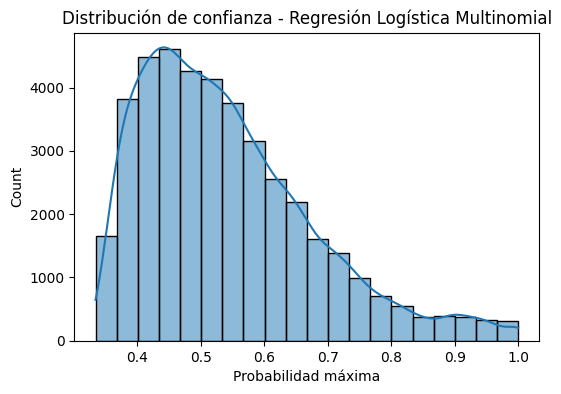

In [101]:
confidence_lr = np.max(all_y_proba_lr, axis=1)
plt.figure(figsize=(6,4))
sns.histplot(confidence_lr, bins=20, kde=True)
plt.title('Distribución de confianza - Regresión Logística Multinomial')
plt.xlabel('Probabilidad máxima')
plt.show()

## Gradient Boosting

In [108]:
from sklearn.ensemble import HistGradientBoostingClassifier

hgb_model = HistGradientBoostingClassifier(
    max_iter=200,
    learning_rate=0.1,
    max_depth=6,
    random_state=42
)

In [109]:
all_y_test_hgb = []
all_y_pred_hgb = []
all_y_proba_hgb = []

for fold, (train_idx, test_idx) in enumerate(tscv.split(X), start=1):
    X_train = X.iloc[train_idx] if hasattr(X, "iloc") else X[train_idx]
    X_test  = X.iloc[test_idx]  if hasattr(X, "iloc") else X[test_idx]
    y_train = y.iloc[train_idx] if hasattr(y, "iloc") else y[train_idx]
    y_test  = y.iloc[test_idx]  if hasattr(y, "iloc") else y[test_idx]

    hgb_model.fit(X_train, y_train)

    y_pred = hgb_model.predict(X_test)

    # ⚠️ este modelo sí tiene predict_proba, pero a veces depende de versión
    if hasattr(hgb_model, "predict_proba"):
        y_proba = hgb_model.predict_proba(X_test)
    else:
        y_proba = None

    all_y_test_hgb.append(np.array(y_test))
    all_y_pred_hgb.append(y_pred)
    if y_proba is not None:
        all_y_proba_hgb.append(y_proba)

    acc = accuracy_score(y_test, y_pred)
    print(f"Fold {fold} - Accuracy: {acc:.4f}")

all_y_test_hgb = np.concatenate(all_y_test_hgb)
all_y_pred_hgb = np.concatenate(all_y_pred_hgb)

if all_y_proba_hgb:
    all_y_proba_hgb = np.vstack(all_y_proba_hgb)

print(f"\nAccuracy general: {accuracy_score(all_y_test_hgb, all_y_pred_hgb):.4f}")

Fold 1 - Accuracy: 0.4878
Fold 2 - Accuracy: 0.5460
Fold 3 - Accuracy: 0.5708
Fold 4 - Accuracy: 0.5760
Fold 5 - Accuracy: 0.6119

Accuracy general: 0.5585


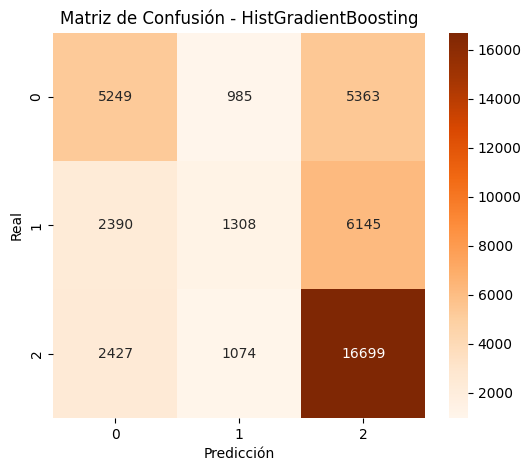

In [110]:
cm_hgb = confusion_matrix(all_y_test_hgb, all_y_pred_hgb)

plt.figure(figsize=(6,5))
sns.heatmap(cm_hgb, annot=True, fmt='d', cmap='Oranges')
plt.title('Matriz de Confusión - HistGradientBoosting')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.show()

In [111]:
print('=== REPORTE DE CLASIFICACIÓN (HGB) ===')
print(classification_report(all_y_test_hgb, all_y_pred_hgb))

=== REPORTE DE CLASIFICACIÓN (HGB) ===
              precision    recall  f1-score   support

           0       0.52      0.45      0.48     11597
           1       0.39      0.13      0.20      9843
           2       0.59      0.83      0.69     20200

    accuracy                           0.56     41640
   macro avg       0.50      0.47      0.46     41640
weighted avg       0.52      0.56      0.52     41640



In [114]:
if isinstance(all_y_proba_hgb, np.ndarray) and all_y_proba_hgb.size > 0:
    classes_hgb = np.unique(all_y_test_hgb)
    y_test_bin_hgb = label_binarize(all_y_test_hgb, classes=classes_hgb)

    auc_macro_hgb = roc_auc_score(
        y_test_bin_hgb,
        all_y_proba_hgb,
        average='macro',
        multi_class='ovr'
    )

    auc_weighted_hgb = roc_auc_score(
        y_test_bin_hgb,
        all_y_proba_hgb,
        average='weighted',
        multi_class='ovr'
    )

    print(f"AUC Macro: {auc_macro_hgb:.4f}")
    print(f"AUC Weighted: {auc_weighted_hgb:.4f}")
else:
    print("No hay probabilidades disponibles para calcular AUC.")

AUC Macro: 0.6889
AUC Weighted: 0.7015


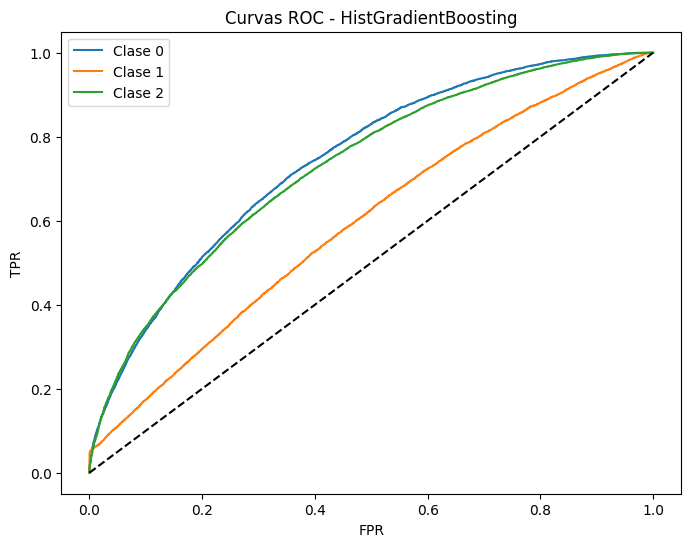

In [115]:
if isinstance(all_y_proba_hgb, np.ndarray) and all_y_proba_hgb.size > 0:
    plt.figure(figsize=(8,6))

    for i, class_label in enumerate(classes_hgb):
        fpr, tpr, _ = roc_curve(
            y_test_bin_hgb[:, i],
            all_y_proba_hgb[:, i]
        )
        plt.plot(fpr, tpr, label=f'Clase {class_label}')

    plt.plot([0,1], [0,1], 'k--')
    plt.title('Curvas ROC - HistGradientBoosting')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend()
    plt.show()
else:
    print("No se pueden graficar curvas ROC (faltan probabilidades).")

In [116]:
errors_hgb = pd.DataFrame({
    'y_true': all_y_test_hgb,
    'y_pred': all_y_pred_hgb
})

errors_hgb['correct'] = errors_hgb['y_true'] == errors_hgb['y_pred']

error_rate_hgb = 1 - errors_hgb['correct'].mean()
print(f"\nError rate (HGB): {error_rate_hgb:.4f}")

print("\nEjemplos de errores:")
display(errors_hgb[errors_hgb['correct'] == False].head())

print("\nErrores por clase:")
print(errors_hgb.groupby('y_true')['correct'].apply(lambda x: 1 - x.mean()))


Error rate (HGB): 0.4415

Ejemplos de errores:


,y_true,y_pred,correct
1,2,1,False
2,1,2,False
3,0,2,False
9,1,2,False
10,1,2,False



Errores por clase:
y_true
0   0.5474
1   0.8671
2   0.1733
Name: correct, dtype: float64
